## Pycytominer example pipeline
requires scipy=<1.7.3


### TODO: 
- [X] Import all data and save intermediate steps.
- [X] Plot grit scores, 
- [ ] percent replicating.
- [X] PCA of the dmso of different cell lines. 
- [X] How many replicates remain per condition?
- [ ] Better visualization of the PCA
- [X] Montage of certain compound / concentration
- [ ] Volcano plot
- [ ] Hierarchical clustering of fingerprints

#### Thoughts
* More restrictive preprocessing of the data does not do so much.

### Set-up

In [1]:
import os
import numpy as np
import pandas as pd
import string

# pycytominer
# from pycytominer import aggregate
from pycytominer import annotate
# from pycytominer import consensus
from pycytominer import feature_select
from pycytominer import normalize

# Import these for plotting
import umap.umap_ as umap
import umap.plot
import matplotlib as mpl
from matplotlib.text import Text
import matplotlib.pyplot as plt
import seaborn as sns; sns.set_style("white")
%matplotlib inline
from sklearn.decomposition import PCA
from cytominer_eval import evaluate
from PIL import Image

# Set current working directory
print(os.getcwd())
os.chdir('../maxproject_features/')
print(os.getcwd())

2024-07-31 09:27:58.224771: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


/share/data/analyses/christa/colopaint3D/maxproject_features
/share/data/analyses/christa/colopaint3D/maxproject_features


In [2]:
OutputDir = "results" # Where do you want to save the merged data csv? 
if not os.path.exists(OutputDir):
    os.makedirs(OutputDir)

cells = ['HCT116', 'HT29']

In [3]:
## Figure settings 

dpi = 300
figsize = (2.24, 2.24)

mpl.rcParams['pdf.fonttype'] = 42  
mpl.rcParams['ps.fonttype'] = 42  


# Font sizes
title_size = 12
axis_label_size = 10
label_size = 6


### Perfrom quality control



In [4]:
### Some settings

features = ['ImageQuality_PowerLogLogSlope_PHAandWGA', 'ImageQuality_PowerLogLogSlope_HOECHST', 'ImageQuality_PowerLogLogSlope_CONC','ImageQuality_PowerLogLogSlope_SYTO', 'ImageQuality_PowerLogLogSlope_MITO']
plates = ["PB000137", "PB000138", "PB000139", "PB000140", "PB000141", "PB000142"]

cutoff = 0.93

In [5]:
# Initialize the dataframe
QC = pd.DataFrame()

for plate in plates:
    # Import QC for all cell lines 
    QCfile = "/share/data/cellprofiler/automation/results/spher-colo52/{}/QC/qcRAW_images.csv".format(plate)

    # Import the data
    data = pd.read_csv(QCfile, index_col=0)
    data['barcode'] = plate

    data['flag'] = 0
    for feature in features: 
        data['flag'] = data['flag'] + (data[feature] > data[feature].quantile(cutoff)).astype(int)

    # Merge the data
    QC = pd.concat([QC, data])
    

# Update the source layout to match the new well assignments 
QC['well'] = QC['FileName_CONC'].str.split('-', expand=True)[1]
QC['well_number'] = QC['well'].str.split('(\d+)', expand=True)[1].str.lstrip('0').astype(int)
QC['well_letter'] = QC['well'].str.split('(\d+)', expand=True)[0].map(lambda x: ord(x) - 64)

QC['plate_well'] = QC['well'] + "_" + QC['barcode']

# Save the merged data
QC.to_csv("{}/QCFlags.csv".format(OutputDir), index=False)

In [6]:
## Quick QC

for plate in plates:

    # define a 386-well plate
    cols = 24
    rows = 16

    heatmap = np.zeros((rows,cols))

    plot_df = QC[QC['barcode'] == plate]

    for i in range(len(plot_df)):
        heatmap[plot_df['well_letter'].iloc[i]-1,plot_df['well_number'].iloc[i]-1] = plot_df['flag'].iloc[i]

    fig = plt.figure(figsize=figsize, dpi=dpi)
   
    %matplotlib inline
    yticklabels= list(string.ascii_uppercase)[:16]
    xticklabels = range(1, 25)

    ax = sns.heatmap(heatmap, linewidths=1, cmap='Reds', yticklabels=yticklabels, xticklabels=xticklabels, cbar=False)
    ax.set_title('# Flags: {}'.format(plate), fontsize=title_size)
    ax.xaxis.tick_top()
    # Hide major ticks but keep the labels
    ax.tick_params(axis='both', which='both', length=0)

    # We change the fontsize of minor ticks label 
    ax.tick_params(axis='both', labelsize=6)

    # box tight
    plt.tight_layout()

    plt.savefig("{}/{}_QC.pdf".format(OutputDir, plate), dpi=dpi)
    plt.close()

    


### Visualization

In [7]:
# ## Create a montage of all images

# plate = "PB000142"

# n = 64
# # n= 512

# dir = ("/share/data/cellprofiler/automation/results/spher-colo52/{}/img/segmentation/".format(plate))

# # List files in the directory with the .png extension
# files = [f for f in os.listdir(dir) if f.endswith('.png')]

# # string split the name with '_' and take the third part
# # this will be the well name
# wells = [f.split('_')[2] for f in files]

# # Convert the well names and paths to a pandas dataframe
# images = pd.DataFrame({'well_id': wells, 'name': files, 'barcode': plate, 'path': [dir + f for f in files]})
# images['well_number'] = images['well_id'].str.split('(\d+)', expand=True)[1].str.lstrip('0').astype(int)
# images['well_letter'] = images['well_id'].str.split('(\d+)', expand=True)[0].map(lambda x: ord(x) - 64)

# montage = Image.new('RGB', (cols*n, rows*n))

# for i in range(len(images)):
#     well = images['well_id'].iloc[i]
#     img = Image.open("/share/data/cellprofiler/automation/results/spher-colo52/{}/img/segmentation/spheroid_segmented_{}_None.png".format(plate, well))
#     img = img.resize((n, n))
#     montage.paste(img, ((images['well_number'].iloc[i]-1)*n, (images['well_letter'].iloc[i]-1)*n))

# # display(montage)

# montage.save("img/" + plate + "_montage.png")


### Preprocess with pycytominer

In [8]:
## Import data and remove QC flags

data = pd.DataFrame()

for plate in plates:
    # Import QC for all cell lines 
    data_file = "/share/data/cellprofiler/automation/results/spher-colo52/{}/results/featICF_spheroid.csv".format(plate)

    # Import the data
    tmp= pd.read_csv(data_file, index_col=0)
    tmp['barcode'] = plate

    print("Data", plate ,":\n", tmp.shape)

    # Merge the data
    data = pd.concat([data, tmp])
    print("XXX", data.shape)

# Rename the plate_well using Metadata_barcode and well_id
data['plate_well'] = data['Metadata_Well'] + "_" + data['barcode']

df = data.merge(QC[['plate_well', 'well', 'flag']], left_on=['plate_well'], right_on=['plate_well'])

print("Data before QC:\n", df.shape)

# Filter out wells with 2 or more flags
df = df[df['flag'] < 2]

print("Data after QC:\n", df.shape, "\n")


## Are there any NaNs? 
nans = df.isna().sum()
nans = nans[nans > 0]

print("There are so many nans:\n", nans)

Data PB000137 :
 (287, 738)
XXX (287, 738)
Data PB000138 :
 (287, 738)
XXX (574, 738)
Data PB000139 :
 (264, 738)
XXX (838, 738)
Data PB000140 :
 (264, 738)
XXX (1102, 738)
Data PB000141 :
 (254, 738)
XXX (1356, 738)
Data PB000142 :
 (260, 738)
XXX (1616, 738)
Data before QC:
 (1616, 741)
Data after QC:
 (1460, 741) 

There are so many nans:
 Metadata_Channel         1460
Metadata_Channel.1       1460
Metadata_FileLocation    1460
dtype: int64


In [9]:
# # Create a Metadata_Well from the Filename
# df["Metadata_well_id"] = df["FileName_CONC"].str.split("_").str[-1].str.split(".").str[0]

# Remove non-data features from the list of features
ListOfFeatures = list(df.columns.values)
ListOfMetadata = list(df.columns[
    df.columns.str.contains("FileName_") |
    df.columns.str.contains("PathName_") |
    df.columns.str.contains("Metadata_")])
ListOfFeatures = list(set(ListOfFeatures) - set(ListOfMetadata) - set(['ObjectNumber', 'Number_Object_Number', 'well', 'flag']))

# ListOfMetadataNew = ["Metadata_Well", "cell_line"] 

# Remove all metadata, paths and filenames except for the well_id
df = df[ListOfFeatures +  ["Metadata_Well"]]

In [10]:
# Import Metadata
dfLayout = pd.read_csv('colo52-v1-import-inputFiles-and-PLAIDresults - 5-metadata.csv', sep=",")
# dfLayout = dfLayout.loc[~(dfLayout.layout_id == 'spher010-P1-L2')]
# Rename the plate_well using Metadata_barcode and well_id
dfLayout['plate_well'] = dfLayout['well_id'] + "_" + dfLayout['barcode']
dfLayout['name'] = dfLayout['cmpdname'].str[:5]

print(dfLayout.shape)
dfLayout.head()

(1848, 28)


,layout_id,well_id,image_id,cp_id,barcode,plate_well,cmpd_code,cmpdname,solvent,cmpd_conc,...,article_id,target,pathway,pubchemID,smiles,inkey,target_type,clinical_status,cell_line,name
0,spher-colo52-v1-ULA-PB000137-HCT116-48h-P1-L1,B02,4185,5532,PB000137,B02_PB000137,colo-006,PD0325901,dmso,3.0,...,S1036,MEK,MAPK,9826528.0,OCC(O)CONC(=O)C1=C(NC2=CC=C(I)C=C2F)C(=C(F)C=C1)F,SUDAHWBOROXANE-SECBINFHSA-N,Targeted,Phase 2,HCT116,PD032
1,spher-colo52-v1-ULA-PB000137-HCT116-48h-P1-L1,B03,4185,5532,PB000137,B03_PB000137,colo-018,Paclitaxel,dmso,0.1,...,S1150,"Autophagy,Microtubule Associated",Cytoskeletal Signaling,441276.0,CC(=O)OC1C(=O)C2(C)C(O)CC3OCC3(OC(C)=O)C2C(OC(...,RCINICONZNJXQF-VAZQATRQSA-N,Cytotoxic,Preclinical,HCT116,Pacli
2,spher-colo52-v1-ULA-PB000137-HCT116-48h-P1-L1,B04,4185,5532,PB000137,B04_PB000137,colo-009,"Olaparib (AZD2281, Ku-0059436)",dmso,3.0,...,S1060,PARP,DNA Damage,23725625.0,FC1=C(C=C(CC2=NNC(=O)C3=C2C=CC=C3)C=C1)C(=O)N4...,FDLYAMZZIXQODN-UHFFFAOYSA-N,Targeted,Launched,HCT116,Olapa
3,spher-colo52-v1-ULA-PB000137-HCT116-48h-P1-L1,B05,4185,5532,PB000137,B05_PB000137,colo-012,SB216763,dmso,10.0,...,S1075,GSK-3,PI3K/Akt/mTOR,176158.0,C[N]1C=C(C2=C1C=CC=C2)C3=C(C(=O)NC3=O)C4=CC=C(...,JCSGFHVFHSKIJH-UHFFFAOYSA-N,Targeted,Preclinical,HCT116,SB216
4,spher-colo52-v1-ULA-PB000137-HCT116-48h-P1-L1,B06,4185,5532,PB000137,B06_PB000137,colo-008,"Vorinostat (SAHA, MK0683)",dmso,3.0,...,S1047,"Autophagy,HDAC",Epigenetics,5311.0,ONC(=O)CCCCCCC(=O)NC1=CC=CC=C1,WAEXFXRVDQXREF-UHFFFAOYSA-N,Targeted,Launched,HCT116,Vorin


In [11]:
# Annotate: connect metadata to the feature data
# OBS: metadata will be prefixed with 'Metadata_'
annotated = annotate(df, platemap=dfLayout, join_on=['Metadata_plate_well', 'plate_well'],add_metadata_id_to_platemap=True, format_broad_cmap=False, clean_cellprofiler=False)
# annotated.to_csv("{}/annotated_data_{}.csv".format(OutputDir, cell_line))

annotated.shape

(1460, 748)

In [12]:
# Remove non-data features from the list of features
ListOfFeatures = list(df.columns.values)
ListOfMetadata = list(df.columns[df.columns.str.contains("Metadata_")])
ListOfFeatures = list(set(ListOfFeatures) - set(ListOfMetadata) - set(["plate_well", "barcode", "cell_line"]))

In [13]:
annotated['Metadata_norm_unit'] = annotated['Metadata_barcode'] + "_" + annotated['Metadata_cell_line']
units = annotated['Metadata_norm_unit'].unique()

In [14]:
#
# Version 2: Normalize separately per 1) plate and 2) cell line
#

# # Normalize separately per cell line
# ListOfPlates = annotated['Metadata_layout_id'].unique()

# itnitialize an empty dataframe
normalized = pd.DataFrame(columns=annotated.columns.values)
normalized = normalized.drop(columns=['plate_well', 'barcode'])

for unit in units:
    
    annotated_temp = annotated[annotated['Metadata_norm_unit'] == unit]

    # Normalize: choose between standardize, robustize, mad_robustize, spherize 
    normalized_temp = normalize(annotated_temp, 
                                features=ListOfFeatures,image_features=False, 
                                meta_features="infer", samples="Metadata_pert_type == 'neg_con'", 
                                method="standardize")
    normalized = pd.concat([normalized, normalized_temp], ignore_index=True)

    print(unit)


PB000137_HCT116
PB000139_HCT116
PB000139_HT29
PB000141_HT29
PB000138_HCT116
PB000140_HCT116
PB000140_HT29
PB000142_HT29


In [15]:
# Feature selection: "variance_threshold", "correlation_threshold", "drop_na_columns", "blocklist", "drop_outliers", "noise_removal",
to_clip_df = feature_select(normalized, features=ListOfFeatures, operation=["variance_threshold", "correlation_threshold","drop_na_columns", "blocklist" ])

In [16]:
# Remove non-data features from the list
ListOfSelectedFeatures = list(to_clip_df.columns.values)
ListOfMetadata = list(to_clip_df.columns[to_clip_df.columns.str.contains("Metadata_")])
ListOfSelectedFeatures = list(set(ListOfSelectedFeatures) - set(ListOfMetadata))

In [17]:
# Instead of removing the outliers, we can clip them to the 1st and 99th percentile.
selected_df = pd.concat([to_clip_df[ListOfMetadata], to_clip_df[ListOfSelectedFeatures].clip(lower=-40, upper=40, axis=1)], axis=1)
print(selected_df.shape)

(1460, 503)


In [18]:
selected_df.to_csv("{}/selected_data.csv".format(OutputDir))

### Sanity Checks

In [19]:
## Count how many replicates per condition remain

check_df = selected_df.copy()
check_df['Metadata_condition'] = check_df['Metadata_name'] + "_" + check_df['Metadata_cmpd_conc'].astype(str)


# Count the number of replicates per condition
replicates = check_df.groupby(['Metadata_condition', 'Metadata_cell_line']).size().reset_index(name='counts')
print(replicates)


    Metadata_condition Metadata_cell_line  counts
0            5Z-7-_0.3             HCT116       4
1            5Z-7-_0.3               HT29       3
2            5Z-7-_1.0             HCT116       4
3            5Z-7-_1.0               HT29       4
4           5Z-7-_10.0               HT29       1
..                 ...                ...     ...
402          sorb_10.0               HT29       6
403           stau_0.1             HCT116       4
404           stau_0.1               HT29       4
405          water_0.5             HCT116       5
406          water_0.5               HT29       8

[407 rows x 3 columns]


In [96]:
# Define the compound and relevant features
cmpd = "fenb"

features = ["Metadata_name", "Metadata_barcode", "Metadata_well_id", "Metadata_cell_line", "Metadata_cmpd_conc"]

# List the wells with the compound
wells = check_df[features][check_df["Metadata_name"] == cmpd]

# Define a function to find image paths
def find_image_paths(row):
    dir_path = f"/share/data/cellprofiler/automation/results/spher-colo52/{row['Metadata_barcode']}/img/segmentation/"
    files = [f for f in os.listdir(dir_path) if row['Metadata_well_id'] in f]
    paths = [os.path.join(dir_path, f) for f in files]
    return pd.Series({'image_name': files, 'image_path': paths})

# Apply the function to each row in the wells DataFrame
image_info = wells.apply(find_image_paths, axis=1)

# Concatenate the original wells DataFrame with the new image information
wells = pd.concat([wells, image_info], axis=1)

# Reset index to handle any misalignment issues
wells.reset_index(drop=True, inplace=True)


HCT116 - fenb


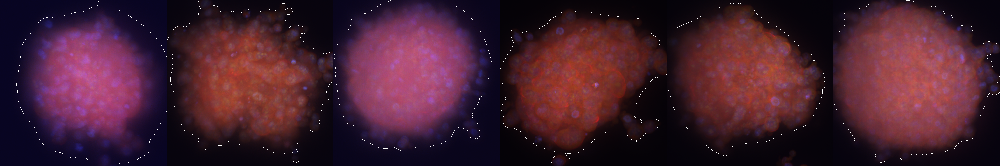

In [97]:

cell_line = "HCT116"

rows=1
images_per_row=6


# Get the size of an image 
img = Image.open(wells['image_path'][0][0])
img_width, img_height = img.size

# Calculate the size of the montage
montage_width = images_per_row * img_width
montage_height = rows * img_height

# Create a blank canvas for the montage
montage = Image.new('RGB', (montage_width, montage_height))

# List contrentrations
concs = wells['Metadata_cmpd_conc'].unique()
concs = sorted(concs, key=lambda x: float(x))

row = 0

# Create the montage
for conc in concs:
    image_paths = wells['image_path'][(wells['Metadata_cmpd_conc'] == conc) & (wells['Metadata_cell_line'] == cell_line)]

    # Load images
    images = [Image.open(path[0]) for path in image_paths]

    # Paste images into the montage
    for i, img in enumerate(images):
        # row = i // images_per_row
        col = i % images_per_row
        montage.paste(img, (col * img_width, row * img_height))
    row += 1

# display smaller
# montage.thumbnail((montage_width // 5, montage_height // 5))


# add a title to the montage
title = f"{cell_line} - {cmpd}"
print(title)
display(montage)
# # Save the montage
# montage.save(output_path)




2.5


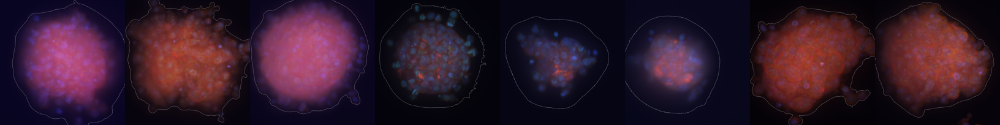

In [22]:


# Define a function to create a montage
def create_montage(image_paths, rows=1, images_per_row=8):
    
    # Load images
    images = [Image.open(path[0]) for path in image_paths]

    # Calculate the size of the montage
    img_width, img_height = images[0].size
    # rows = -(-len(images) // images_per_row)  # Ceiling division
    montage_width = images_per_row * img_width
    montage_height = rows * img_height

    # Create a blank canvas for the montage
    montage = Image.new('RGB', (montage_width, montage_height))

    # Paste images into the montage based on their concentration
    for i, img in enumerate(images):
        row = i // images_per_row
        col = i % images_per_row
        montage.paste(img, (col * img_width, row * img_height))

    # display smaller
    montage.thumbnail((montage_width // 5, montage_height // 5))
    print(conc)
    display(montage)
    # # Save the montage
    # montage.save(output_path)

# # Define output path
# output_montage_path = "image_montage.png"

# Create the montage
for conc in wells['Metadata_cmpd_conc'].unique():
    create_montage(wells['image_path'][wells['Metadata_cmpd_conc'] == conc])


### Generate plots

In [18]:
# df_toplot = selected_df[selected_df['Metadata_pert_type'] != 'trt'] # Only take positive controls
df_toplot = selected_df

# Only take trt at 10um and neg_con 
df_toplot = df_toplot[((df_toplot['Metadata_pert_type'] == 'trt')&(df_toplot['Metadata_cmpd_conc'] == 10.0) )| (df_toplot['Metadata_pert_type'] == 'neg_con')]
df_toplot.shape


(352, 503)

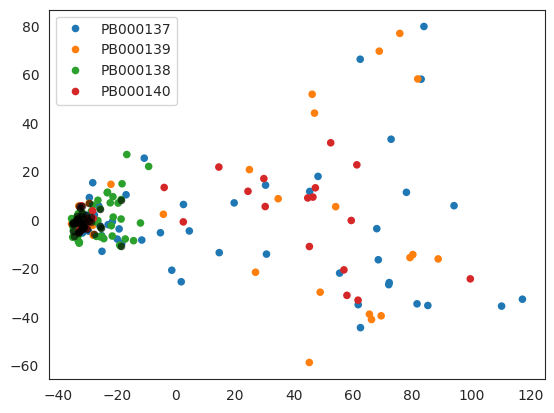

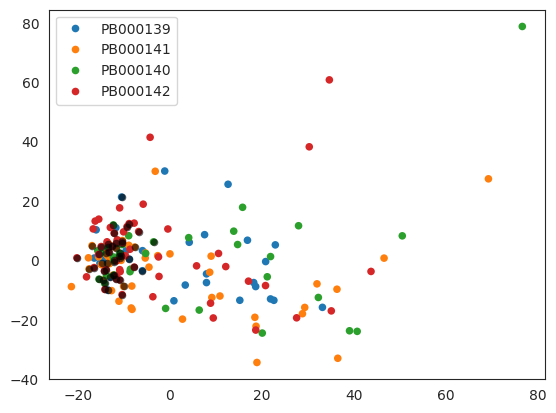

In [19]:
for cell_line in cells: 
    #PCA
    posconDf = df_toplot[df_toplot['Metadata_cell_line'] == cell_line]
    training_data = posconDf.loc[:, ListOfSelectedFeatures[:]].values

    reducer = umap.UMAP(n_components=8, n_neighbors=30, min_dist= 0.1, random_state=42)
    embedding = reducer.fit_transform(training_data)

    # Perform PCA
    pca = PCA(n_components=20)
    pca.fit(training_data)
    pca_embedding = pca.transform(training_data)

    fig = plt.figure()
    
    ax = sns.scatterplot(
    x=pca_embedding[:, 0],
    y=pca_embedding[:, 1],
    hue=posconDf.Metadata_barcode,
    alpha=1,
    linewidth=0,
    marker="o",
    s=30,
    )   

    ax = sns.scatterplot(
    x=pca_embedding[posconDf.Metadata_cmpdname == "dmso", 0],
    y=pca_embedding[posconDf.Metadata_cmpdname == "dmso", 1],
    # hue=posconDf.Metadata_cmpdname,
    c = 'black',
    alpha=0.6,
    linewidth=0,
    marker="o",
    s=30,
    )   

    plt.show()
    ax.title.set_text(cell_line)
    ax.legend(bbox_to_anchor=(1.1, 1), loc=2, borderaxespad=0.0, fontsize=10)
    # fig.savefig("{}/UMAP_{}_{}.png".format(OutputDir, title_str, cell_line), dpi=300)


<Figure size 640x480 with 0 Axes>

/usr/local/lib/python3.8/dist-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 65288 (\N{FULLWIDTH LEFT PARENTHESIS}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.8/dist-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 65289 (\N{FULLWIDTH RIGHT PARENTHESIS}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


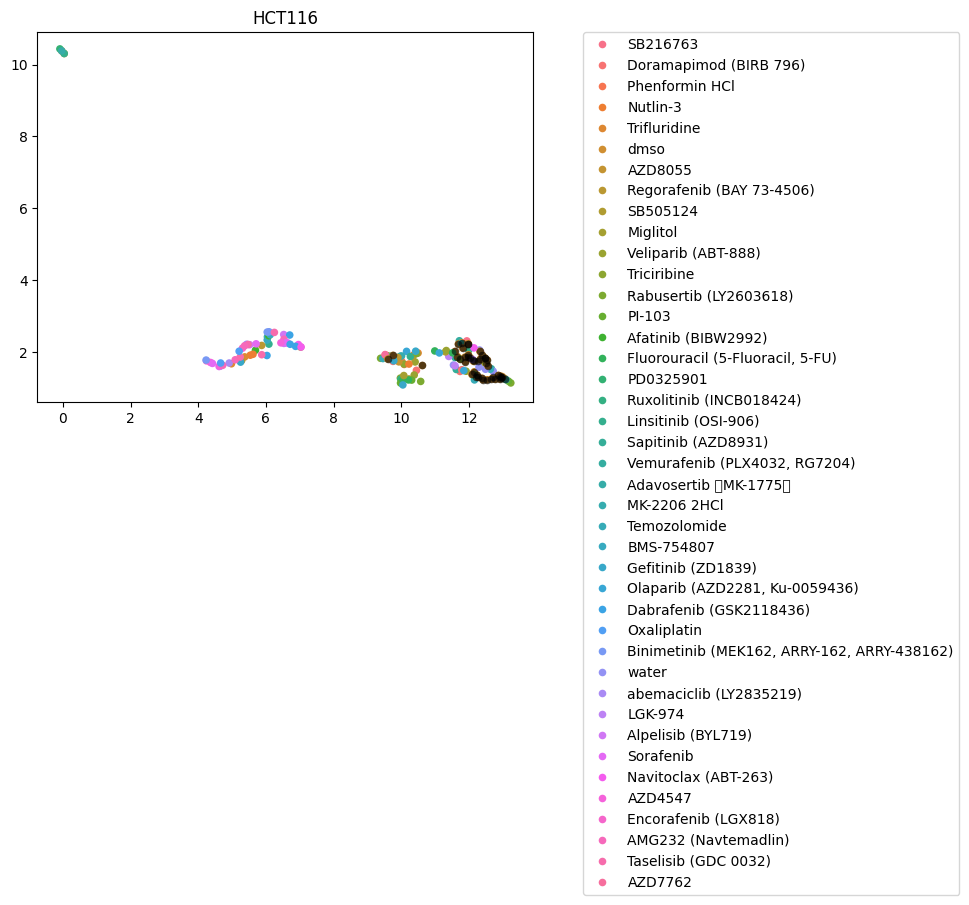

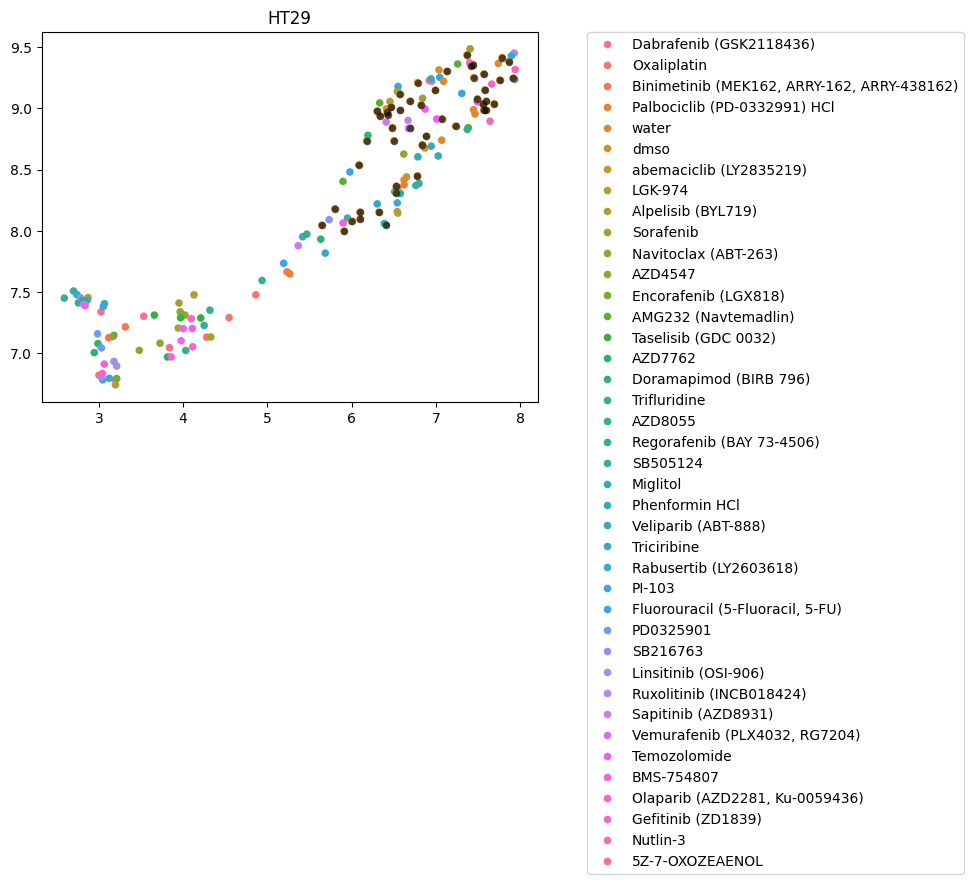

In [67]:
# UMAP

for cell_line in cells: 

    posconDf = df_toplot[df_toplot['Metadata_cell_line'] == cell_line]
    training_data = posconDf.loc[:, ListOfSelectedFeatures[:]].values

    reducer = umap.UMAP(n_components=8, n_neighbors=4, random_state=42)
    embedding = reducer.fit_transform(training_data)

    fig = plt.figure()
    
    ax = sns.scatterplot(
    x=embedding[:, 0],
    y=embedding[:, 1],
    hue=posconDf.Metadata_cmpdname,
    alpha=1,
    linewidth=0,
    marker="o",
    s=30,
    )   

    ax = sns.scatterplot(
    x=embedding[posconDf.Metadata_cmpdname == "dmso", 0],
    y=embedding[posconDf.Metadata_cmpdname == "dmso", 1],
    # hue=posconDf.Metadata_cmpdname,
    c = 'black',
    alpha=0.6,
    linewidth=0,
    marker="o",
    s=30,
    )   

    ax.title.set_text(cell_line)
    ax.legend(bbox_to_anchor=(1.1, 1), loc=2, borderaxespad=0.0, fontsize=10)
    plt.show()
    # fig.savefig("{}/UMAP_{}_{}.png".format(OutputDir, title_str, cell_line), dpi=300)

In [27]:
# Grit scores

for cell_line in cells:

    # Import data 
    # selected_df = pd.read_csv("{}/selected_data_{}.csv".format(BaseDir,cell_line), index_col=0)

    # Remove non-data features from the list
    ListOfSelectedFeatures = list(selected_df.columns.values)
    ListOfMetadata = list(selected_df.columns[selected_df.columns.str.contains("Metadata_")])
    ListOfSelectedFeatures = list(set(ListOfSelectedFeatures) - set(ListOfMetadata))

    dataset = selected_df.copy()
    dataset['Metadata_cell_line'].unique()

    dataset["Metadata_replicate_id"] = (
        dataset["Metadata_name"] + "_" + dataset.index.astype(str)
        ) 

    control_perts = dataset.query("Metadata_name == 'dmso' & Metadata_cmpd_conc == 0.1").Metadata_replicate_id.unique().tolist()
    grit_replicate_groups = {"profile_col": "Metadata_replicate_id", "replicate_group_col": "Metadata_cmpd_conc"}

    # control_perts = dataset.query("Metadata_cmpdname == 'dmso' & Metadata_cmpd_conc == 0.1").Metadata_replicate_id.unique().tolist()
    # grit_replicate_groups = {"profile_col": "Metadata_replicate_id", "replicate_group_col": "Metadata_cmpd_conc"}

    # Remove non-data features from the list
    ListOfSelectedFeatures = list(dataset.columns.values)
    ListOfMetadata = list(dataset.columns[dataset.columns.str.contains("Metadata_")])
    ListOfSelectedFeatures = list(set(ListOfSelectedFeatures) - set(ListOfMetadata))

    grit_scores = []

    # for cell_line in datasetPart.plate.unique():
    #    cell_line_df = datasetPart.query("plate == @cell_line")

    grit_results = evaluate(
        profiles=dataset,
        features=ListOfSelectedFeatures,
        meta_features=ListOfMetadata,
        replicate_groups=grit_replicate_groups,
        operation="grit",
        similarity_metric="pearson",
        grit_replicate_summary_method="median",
        grit_control_perts=control_perts,
    )  # .assign(cell_line=cell_line)

    grit_scores.append(grit_results)

    grit_scores = pd.concat(grit_scores).reset_index(drop=True)
    grit_scores["Metadata_name"] = grit_scores["perturbation"].str.split("_").str[0]
    grit_scores["Metadata_cmpd_conc"] = grit_scores["group"]
    grit_scores.Metadata_cmpd_conc = grit_scores.Metadata_cmpd_conc.astype(float)
    grit_scores.tail(9)

    # Add back the well information
    grit_scores = pd.merge(grit_scores,dataset[['Metadata_well_id', 'Metadata_cell_line', 'Metadata_replicate_id']], left_on='perturbation', right_on='Metadata_replicate_id')

    # grit_scores.to_csv("{}/grit_scores_{}.csv".format(BaseDir,cell_line))


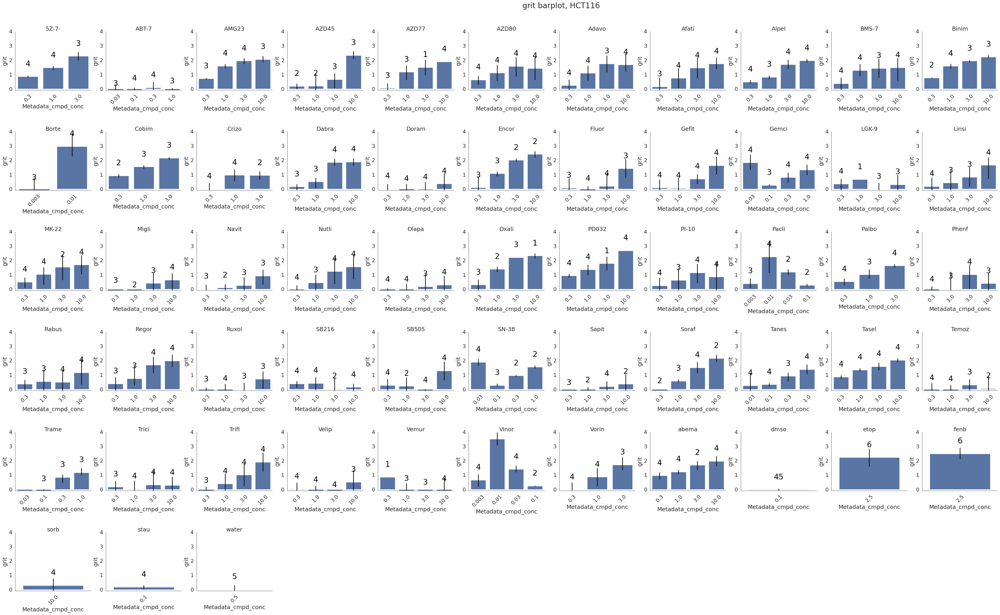

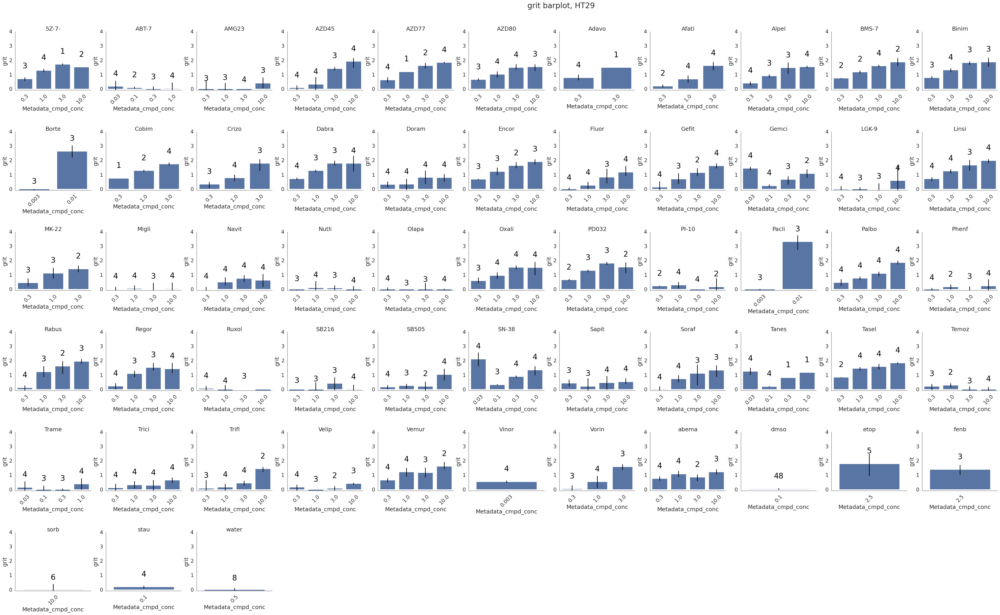

In [28]:
for cell_line in cells:

    replicate = replicates[replicates['Metadata_cell_line'] == cell_line].reset_index()

    fig = plt.figure(figsize=(48, 32))
    sns.set(font_scale=1.5)
    fig.suptitle("grit barplot, " + cell_line, fontsize=24, y=0.92)
    sp = 1
    nrrow = 6
    nrcol = 11

    i = 0
    CompoundsUsed = grit_scores["Metadata_name"].unique()
    for some in CompoundsUsed[:]:
        grit_scores_part = grit_scores[(grit_scores["Metadata_name"] == some) & (grit_scores["Metadata_cell_line"] == cell_line)].copy()
        grit_scores_part.sort_values(by="Metadata_cmpd_conc", inplace=True)
        ax = fig.add_subplot(nrrow, nrcol, sp)
        ax = sns.barplot(
            x="Metadata_cmpd_conc",
            y="grit",
            data=grit_scores_part,
            # palette="Blues_d",
            alpha=1,
            err_kws={'color': 'black', 'linewidth': 2},
            # errwidth=3,
        )

        
        # Annotate with number of replicates using the previously calculated replicates
        for p in ax.patches:
            ax.annotate(
                "{:.0f}".format(replicate['counts'][i]),
                ha="center",
                va="bottom",
                fontsize=24,
                color="black",
                xytext=(0, 5),
                textcoords="offset points",
                xy=(p.get_x() + p.get_width() / 2, p.get_height()+0.5),
            )
            i += 1

        ax.set_facecolor("w")
        ax.spines["bottom"].set_color("grey")
        ax.spines["left"].set_color("grey")
        ax.set_ylim([-0.1, 4])
        ax.set_title("{}".format(some[0:5]), pad=2)
        plt.subplots_adjust( wspace=0.2, hspace=0.7, left=0.0)
        plt.xticks(rotation = 45)
        sp += 1

    # fig.savefig(
    #         "{}/GritScores_{}.{}".format(OutputDir,cell_line,figformat), dpi=dpi, bbox_inches="tight"
    #         )

    plt.show()

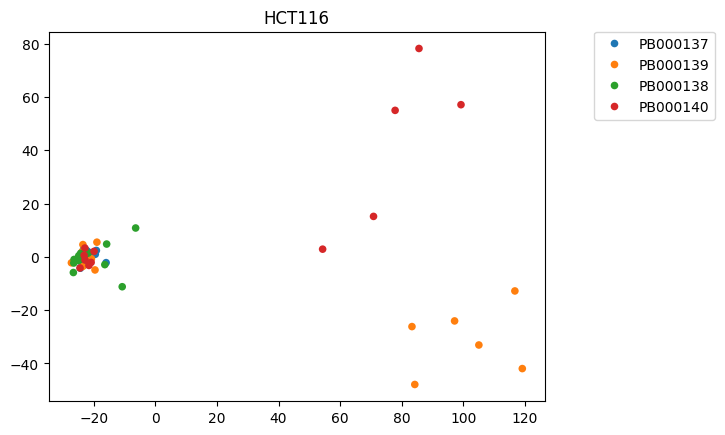

In [63]:

cell_line = 'HCT116'

# Only SN-38
# theseCompounds = ['SN-38', 'dmso']
posconDf = selected_df[((selected_df['Metadata_name'] == 'SN-38') | (selected_df['Metadata_name'] == 'dmso')) & (selected_df['Metadata_cell_line'] == cell_line)]


#PCA
training_data = posconDf.loc[:, ListOfSelectedFeatures[:]].values

# Perform PCA
pca = PCA(n_components=2)
pca.fit(training_data)
pca_embedding = pca.transform(training_data)

fig = plt.figure()

ax = sns.scatterplot(
x=pca_embedding[:, 0],
y=pca_embedding[:, 1],
hue=posconDf.Metadata_barcode,
alpha=1,
linewidth=0,
marker="o",
s=30,
)   

ax.title.set_text(cell_line)
ax.legend(bbox_to_anchor=(1.1, 1), loc=2, borderaxespad=0.0, fontsize=10)
plt.show()


# fig.savefig("{}/UMAP_{}_{}.png".format(OutputDir, title_str, cell_line), dpi=300)


In [21]:
from matplotlib.colors import LogNorm, Normalize

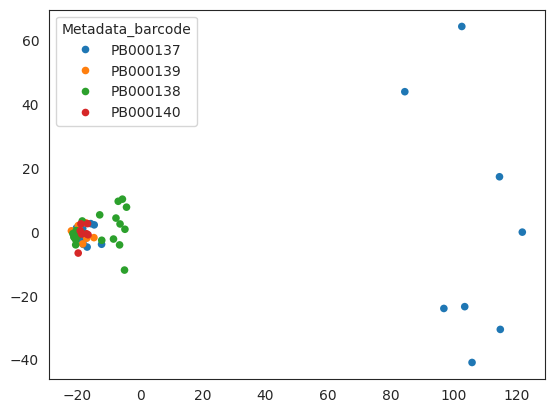

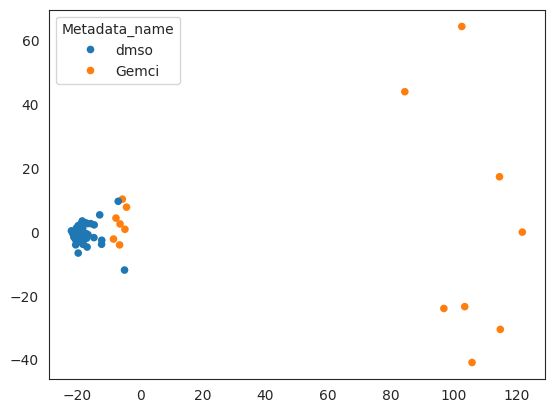

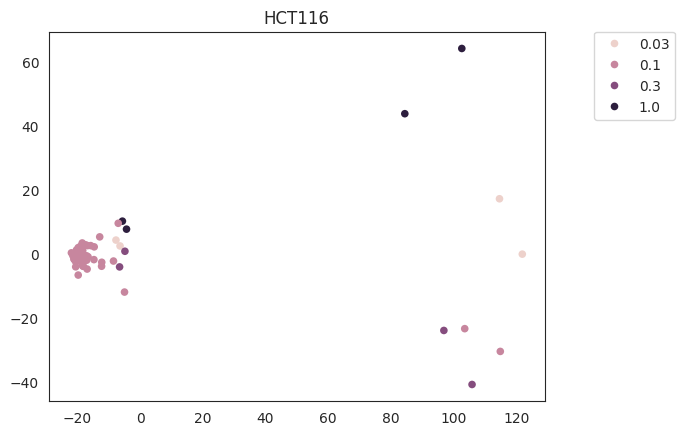

In [26]:

# Close all plots
plt.close('all')

cell_line = 'HCT116'

# Only SN-38
# 
# posconDf = selected_df[((selected_df['Metadata_name'] == 'SN-38') | (selected_df['Metadata_name'] == 'dmso')) & (selected_df['Metadata_cell_line'] == cell_line)]
# theseCompounds = ['SN-38', 'Pacli', 'Vinor','Velip', 'Oxali', 'Trifl', 'Gemci', 'dmso']
theseCompounds = ['Gemci', 'dmso']

# Only take when the compound is in theseCompounds
posconDf = selected_df[(selected_df['Metadata_name'].isin(theseCompounds)) & (selected_df['Metadata_cell_line'] == cell_line)]


#PCA
training_data = posconDf.loc[:, ListOfSelectedFeatures[:]].values

# Perform PCA
pca = PCA(n_components=20)
pca.fit(training_data)
pca_embedding = pca.transform(training_data)

fig = plt.figure()

ax = sns.scatterplot(
x=pca_embedding[:, 0],
y=pca_embedding[:, 1],
hue=posconDf.Metadata_barcode,
alpha=1,
linewidth=0,
marker="o",
s=30,
)   

fig = plt.figure()

ax = sns.scatterplot(
x=pca_embedding[:, 0],
y=pca_embedding[:, 1],
hue=posconDf.Metadata_name,
alpha=1,
linewidth=0,
marker="o",
s=30,
)   

fig = plt.figure()

ax = sns.scatterplot(
x=pca_embedding[:, 0],
y=pca_embedding[:, 1],
hue=posconDf.Metadata_cmpd_conc,
alpha=1,
linewidth=0,
hue_norm=LogNorm(),
marker="o",
s=30,
)   

# ax = sns.scatterplot(
# x=pca_embedding[posconDf.Metadata_cmpdname == "dmso", 0],
# y=pca_embedding[posconDf.Metadata_cmpdname == "dmso", 1],
# # hue=posconDf.Metadata_cmpdname,
# c = 'black',
# alpha=0.6,
# linewidth=0,
# marker="o",
# s=30,
# )   

ax.title.set_text(cell_line)
ax.legend(bbox_to_anchor=(1.1, 1), loc=2, borderaxespad=0.0, fontsize=10)
plt.show()

# fig.savefig("{}/UMAP_{}_{}.png".format(OutputDir, title_str, cell_line), dpi=300)
